In [75]:
%pylab inline

import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

from ddmap import halosim
from ddmap.pixel3D import cartesianGrid3D
from ddmap.sparse import darkmapper
from ddmap import detect3D
from ddmap.halolet import massmap_ks2D

Populating the interactive namespace from numpy and matplotlib


In [49]:
# configuration
configName  =   '../../tests/config_sparse.ini' 
parser      =   ConfigParser()
parser.read(configName)

# Reconstruction Init
parser.set('sparse','mu','3e-4')
if False:
    atomFname='../../tests/haloBasis-nl10-pix48-m146_152.fits'
    parser.set('lens','atomFname',atomFname)
    parser.set('sparse','nframe','1' )
else:
    parser.set('lens','resolve_lim','0.2') #pix
    parser.set('lens','rs_base','0.31')    #Mpc/h
    parser.set('sparse','nframe','1' )
    
# Pixelation
gridInfo=   cartesianGrid3D(parser)
Z,Y,X   =   np.meshgrid(gridInfo.zcgrid,gridInfo.ycgrid,gridInfo.xcgrid,indexing='ij')
x,y,z   =   (X.flatten(),Y.flatten(),Z.flatten())
lensKer1 =   gridInfo.lensing_kernel(deltaIn=False)
lensKer2 =   gridInfo.lensing_kernel(deltaIn=True)

In [128]:
x

array([-0.8       , -0.76666667, -0.73333333, ...,  0.7       ,
        0.73333333,  0.76666667])

In [143]:
gErr    =  np.ones(gridInfo.shape)*1e-3
z_h     =  0.2425
log_m   =  16.74
M_200   =  10.**(log_m)
conc    =  4.#6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
halo    =  halosim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
lk      =  halo.lensKernel(z)
data1   =  halo.DeltaSigmaComplex(x*3600.,y*3600.)*lk
data1   =  data1.reshape(gridInfo.shape)

data2=None
ks2D=massmap_ks2D(gridInfo.ny,gridInfo.nx)
rpix=halo.rs_arcsec/gridInfo.scale/3600.
sigma=halosim.haloCS02SigmaAtom(rpix,ny=gridInfo.ny,nx=gridInfo.nx,smooth_scale=-1,c=halo.c,fou=True)
shear=np.fft.fftshift(ks2D.transform(sigma,inFou=True,outFou=False))
lk2=lk.reshape(gridInfo.shape)
data2=shear[None,:,:]*lk2
    
dmapper=darkmapper(parser,data2.real,data2.imag,gErr,lensKer1)

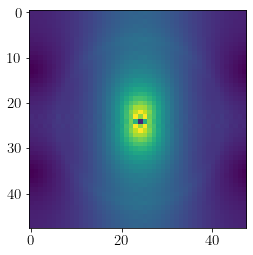

In [144]:
plt.imshow(np.abs(data2[4]));

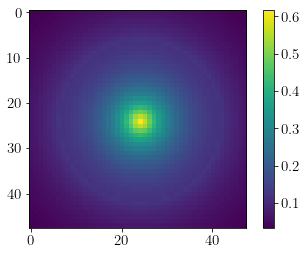

In [145]:
plt.imshow(np.abs(data1[6]));
plt.colorbar()

In [79]:
print(halo.rs)
print(conc)

0.3077792743406577
4.0


In [80]:
print(halo.rs_arcsec/gridInfo.scale/3600.)
print(dmapper.dict2D.rs_frame)

0.95843641574373
[[3.06522341]
 [1.87746964]
 [1.39231829]
 [1.12953695]
 [0.96535184]
 [0.85348029]
 [0.77269328]
 [0.71188289]
 [0.66467247]
 [0.62713966]]


# sparse analysis

/home/xiangchong/.local/code/massMap_Private/ddmap/sparse.py:370: RuntimeWarning: divide by zero encountered in double_scalars
  error=  np.sqrt(np.sum(diff**2.)/np.sum(Xp1**2.))
/home/xiangchong/.local/code/massMap_Private/ddmap/sparse.py:370: RuntimeWarning: invalid value encountered in double_scalars
  error=  np.sqrt(np.sum(diff**2.)/np.sum(Xp1**2.))


CPU times: user 8.31 s, sys: 29.6 ms, total: 8.34 s
Wall time: 8.38 s


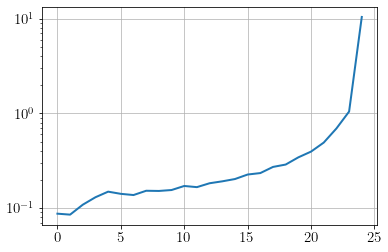

In [81]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.nonNeg=True
dmapper.clean_outcomes()
dmapper.fista_gradient_descent(3000)
#dmapper.optimized_gradient_descent(3000)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 9.01 s, sys: 32.3 ms, total: 9.05 s
Wall time: 9.15 s


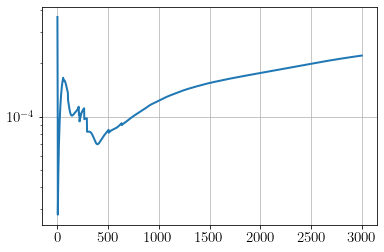

In [57]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.nonNeg=True
w   =   dmapper.adaptive_lasso_weight(gamma=2.)
dmapper.fista_gradient_descent(3000,w=w)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 8.95 s, sys: 0 ns, total: 8.95 s
Wall time: 8.95 s


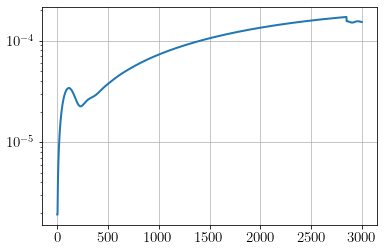

In [58]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.nonNeg=True
w   =   dmapper.adaptive_lasso_weight(gamma=2.)
dmapper.fista_gradient_descent(3000,w=w)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

In [59]:
names   =   ('iz','iy','ix','value')
c1,v1   =   detect3D.local_maxima_3D(dmapper.deltaR[:,:,:])
data1   =   np.hstack([c1,v1[:,None]])
src     =   Table(data=data1,names=names)

In [60]:
src

iz,iy,ix,value
float64,float64,float64,float64
5.0,24.0,24.0,48.442524622356046


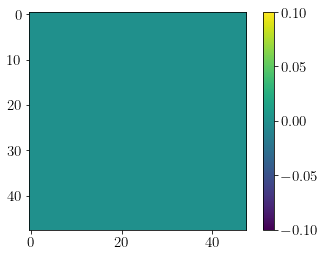

In [72]:
plt.imshow(dmapper.deltaR[3])
plt.colorbar()